In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

/hpc/group/pbenfeylab/ch416/miniconda3/envs/genesys/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
## Conda Env genesys on DCC
print(torch.__version__)
print(sc.__version__) 

1.11.0
1.9.6


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
#dataset = Root_Dataset(data['X_test'], data['y_test'])
#loader = DataLoader(dataset,
#                         batch_size = batch_size,
#                         shuffle = True, drop_last=True)

X_all = np.vstack((data['X_train'],data['X_val'],data['X_test']))
y_all = pd.concat((data['y_train'],data['y_val'],data['y_test']))
dataset = Root_Dataset(X_all, y_all)
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [6]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

## Extract a sample

In [7]:
sample = next(iter(loader))
xo = sample['x'].to(device)
y = sample['y'].to(device)
y_label = [num2class[i] for i in y.tolist()]

In [8]:
xo.shape

torch.Size([2000, 11, 17513])

In [9]:
len(y_label)

2000

In [10]:
len(loader)

55

In [11]:
## GRN for the transition t1 to t3
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            #pred_h = model.init_hidden(batch_size)
            #tfrom = model.generate_current(x, pred_h, 0).to('cpu').detach().numpy()
            #cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            cfrom = x[np.where(np.array(y_label)==ct)[0],1,:] 
            
            #pred_h = model.init_hidden(batch_size)
            #tto = model.generate_next(x, pred_h, 0).to('cpu').detach().numpy()   
            #cto = tto[np.where(np.array(y_label)==ct)[0],:]
            cto = x[np.where(np.array(y_label)==ct)[0],3,:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast


/tmp/ipykernel_824824/580988479.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()


Trichoblast
Cortex
Endodermis
Pericycle
Procambium
Xylem
Phloem
Lateral Root Cap
Columella


In [12]:
# Save the array to disk
np.save('genesys_raw_ctw_t1-t3.npy', ctw)

In [13]:
ctw = np.load('genesys_raw_ctw_t1-t3.npy')

In [14]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    if np.std(ctw[i])==0:
        ctw_z[i] = np.zeros((17513, 17513))
    else:
        ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [15]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [16]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [17]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [18]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

Name
NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: count, dtype: int64

## Network Analysis

In [19]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [20]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

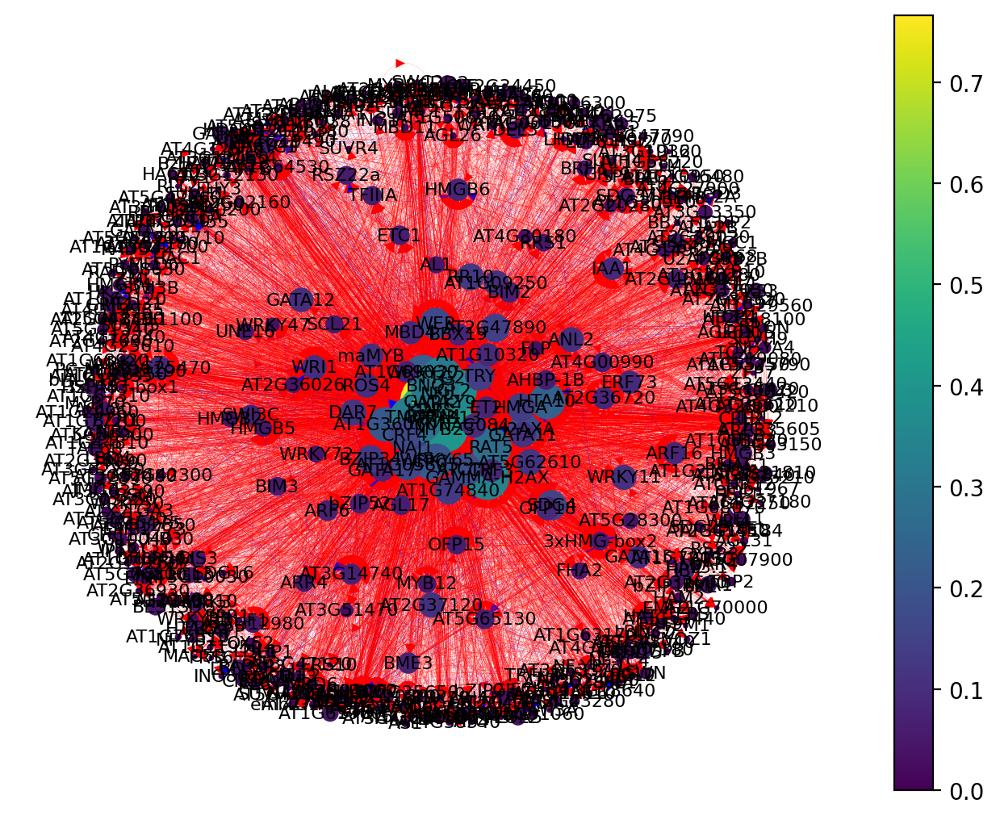

In [21]:
atri = network(0)

In [22]:
atri

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
3xHMG-box2,0.405242,0.052419,0.352823,0.867151,0.000046,0.120740
DEL3,0.094758,0.050403,0.044355,0.865396,0.000023,0.035676
TMO7,0.502016,0.316532,0.185484,0.864899,0.000042,0.135102
AT1G36060,0.413306,0.207661,0.205645,0.861934,0.000039,0.121884
MYB97,0.050403,0.014113,0.036290,0.860578,0.000025,0.022705
...,...,...,...,...,...,...
GRF9,0.022177,0.004032,0.018145,0.000000,0.000023,0.013036
AT5G46910,0.010081,0.000000,0.010081,0.000000,0.000020,0.010241
DAR4,0.014113,0.000000,0.014113,0.000000,0.000023,0.011430
SWN,0.022177,0.018145,0.004032,0.000000,0.000021,0.011525


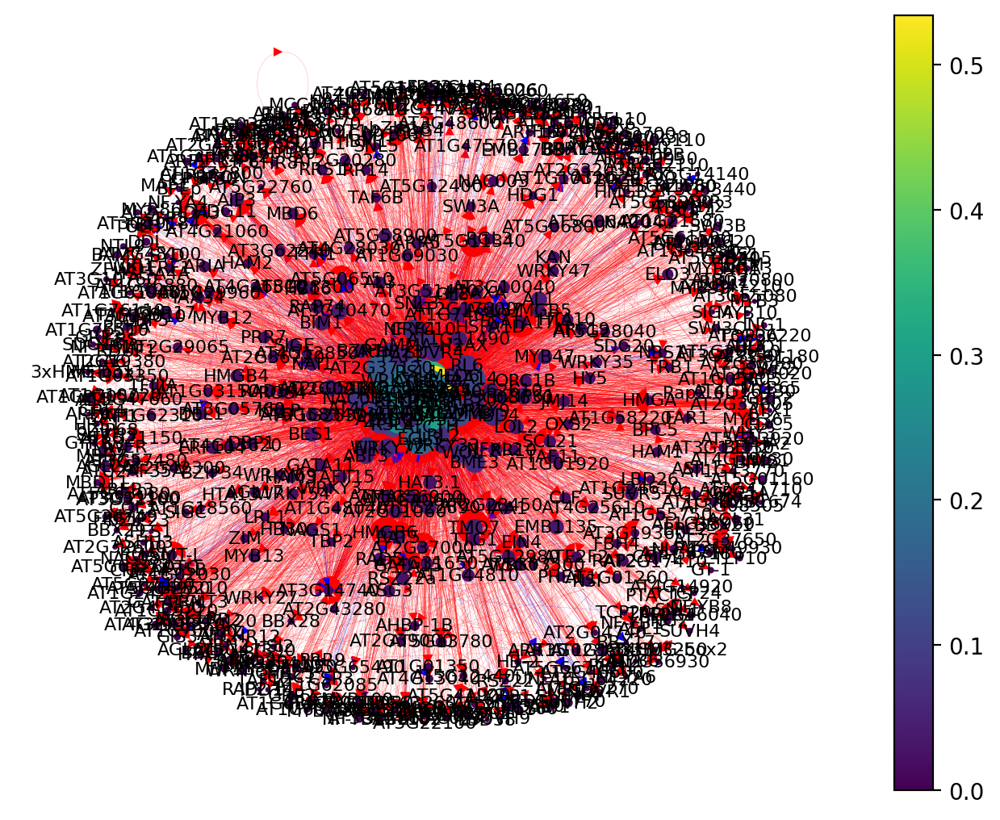

In [23]:
tri = network(1)

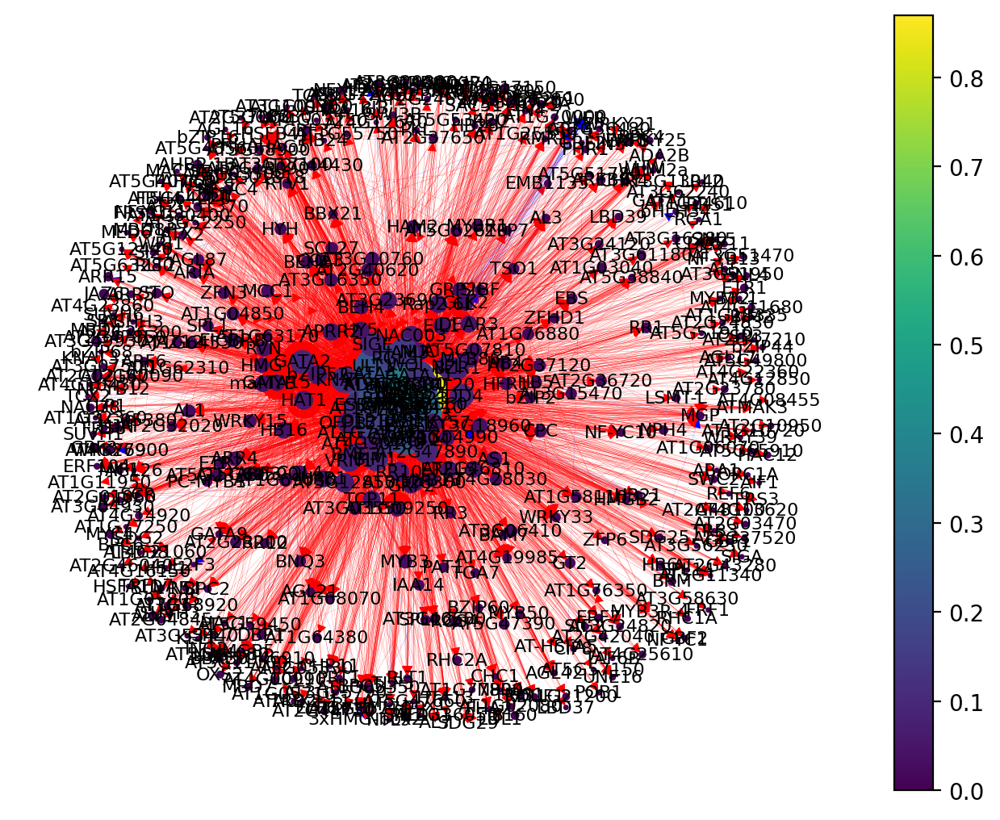

In [24]:
cor = network(2)

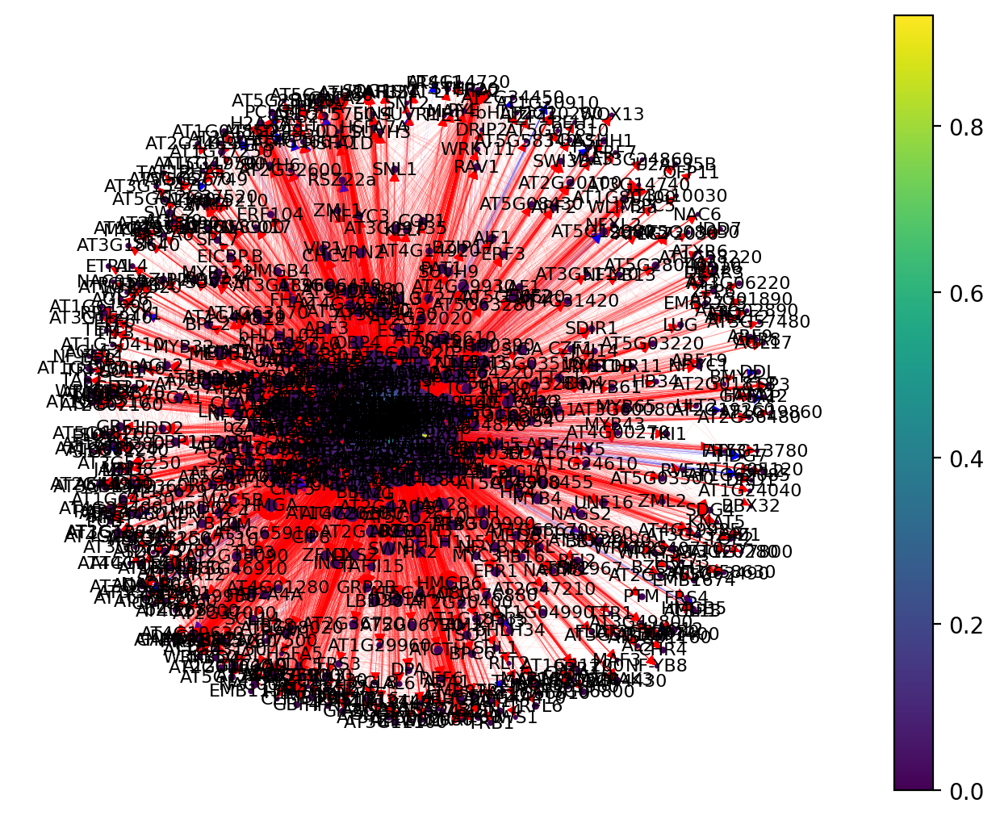

In [25]:
end = network(3)

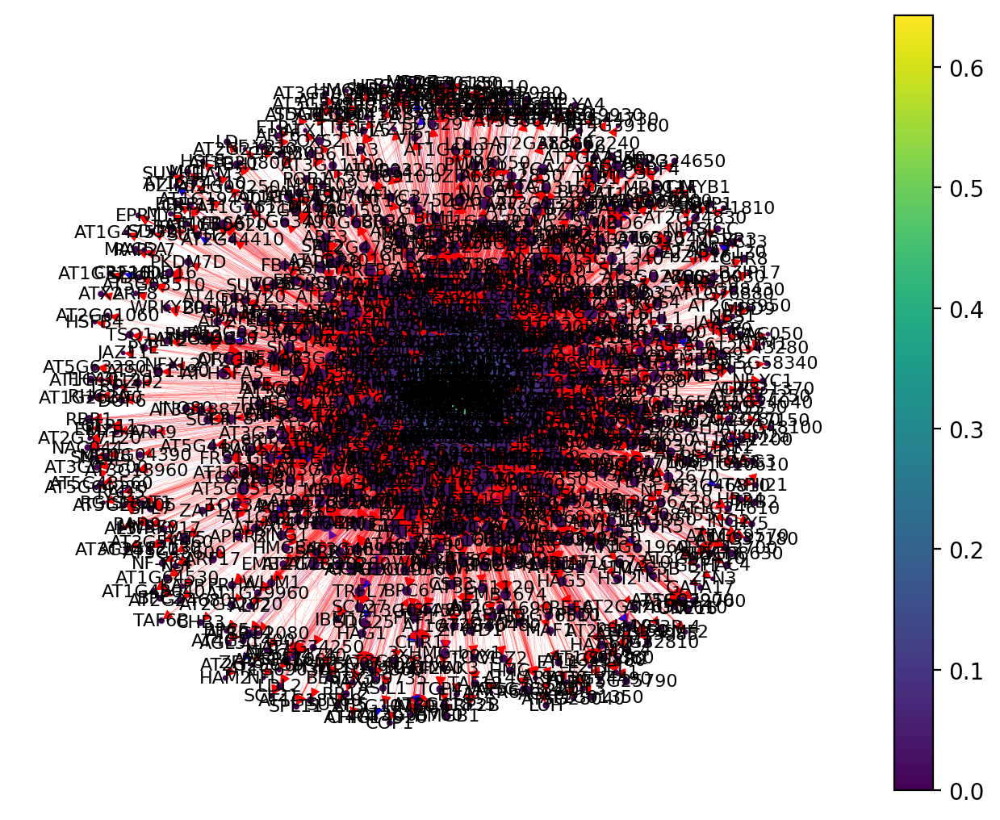

In [26]:
per = network(4)

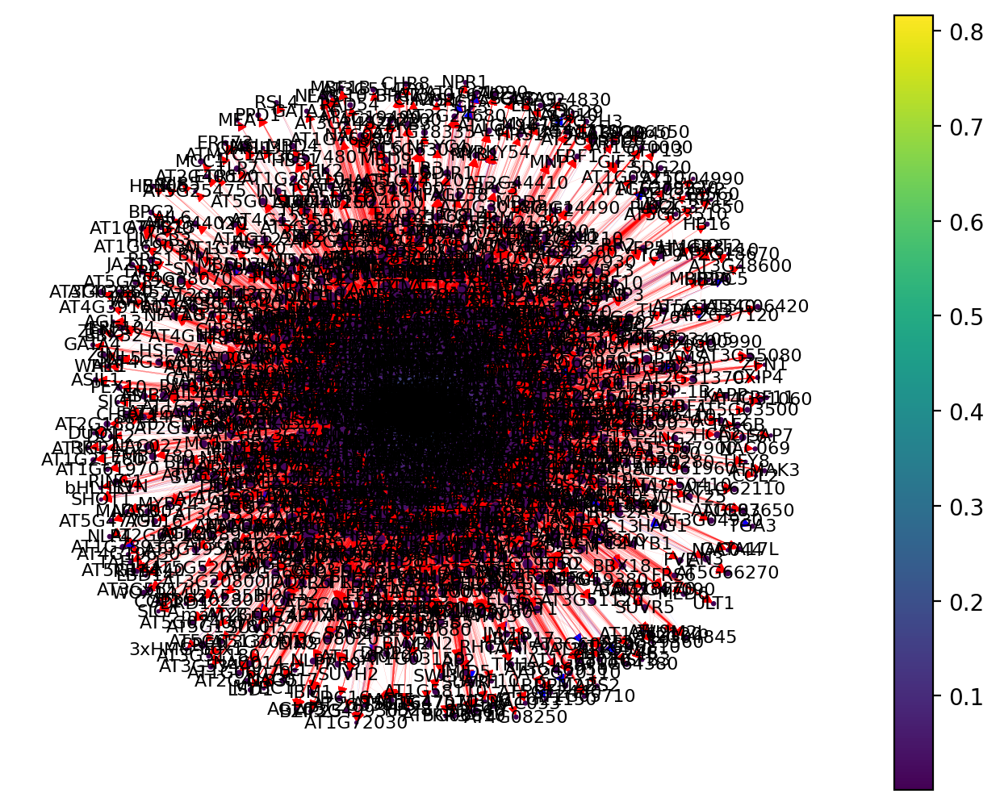

In [27]:
pro = network(5)

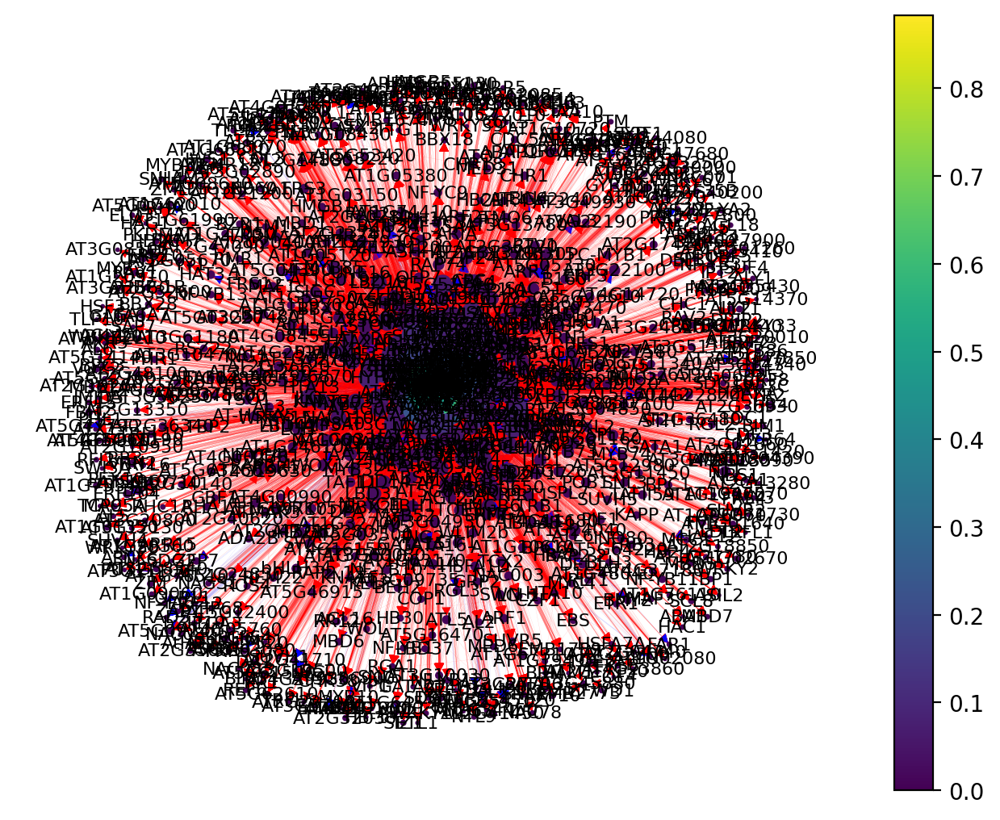

In [28]:
xyl = network(6)

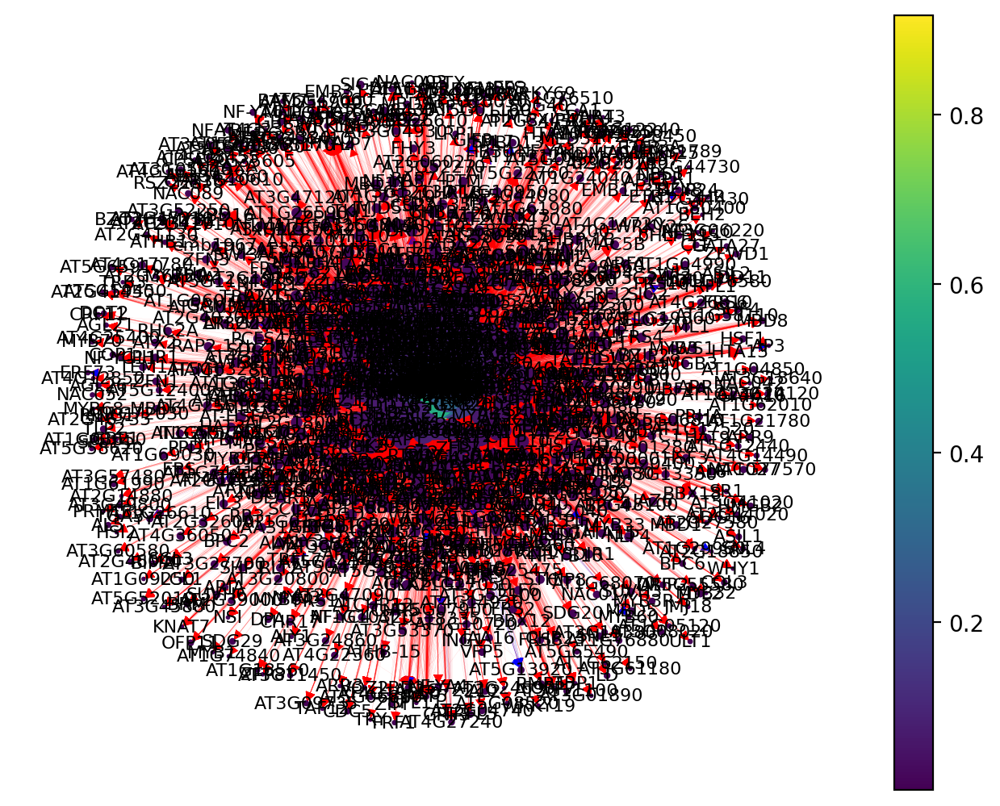

In [29]:
phl = network(7)

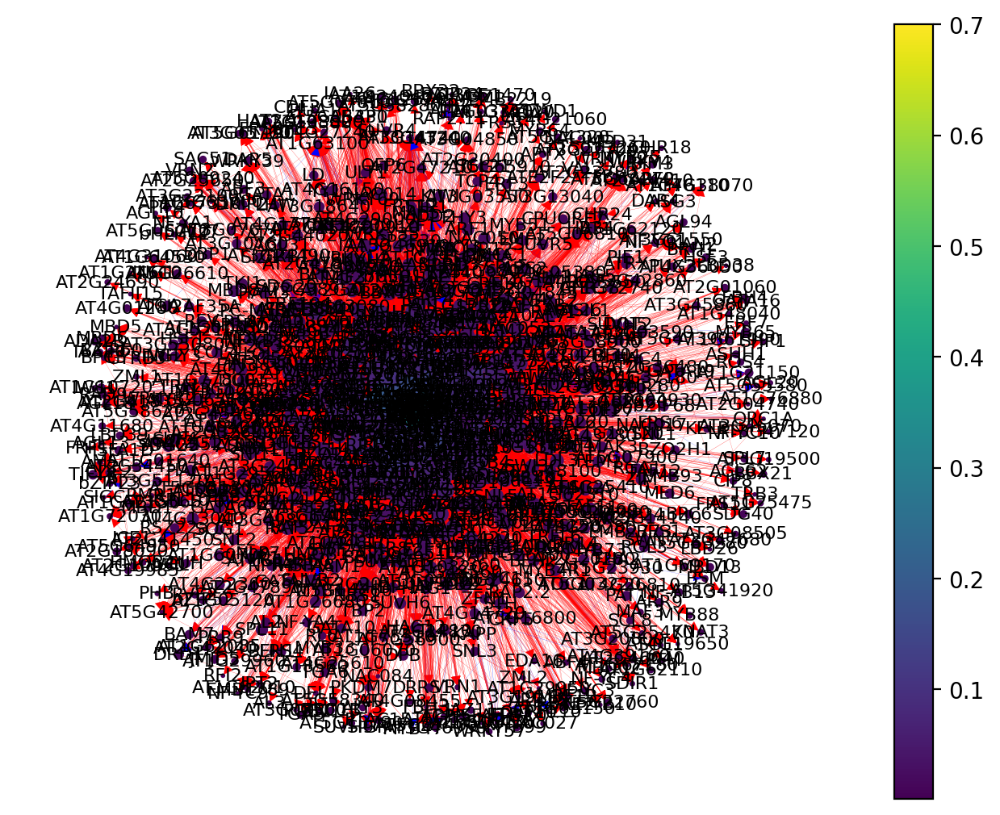

In [30]:
lrc = network(8)

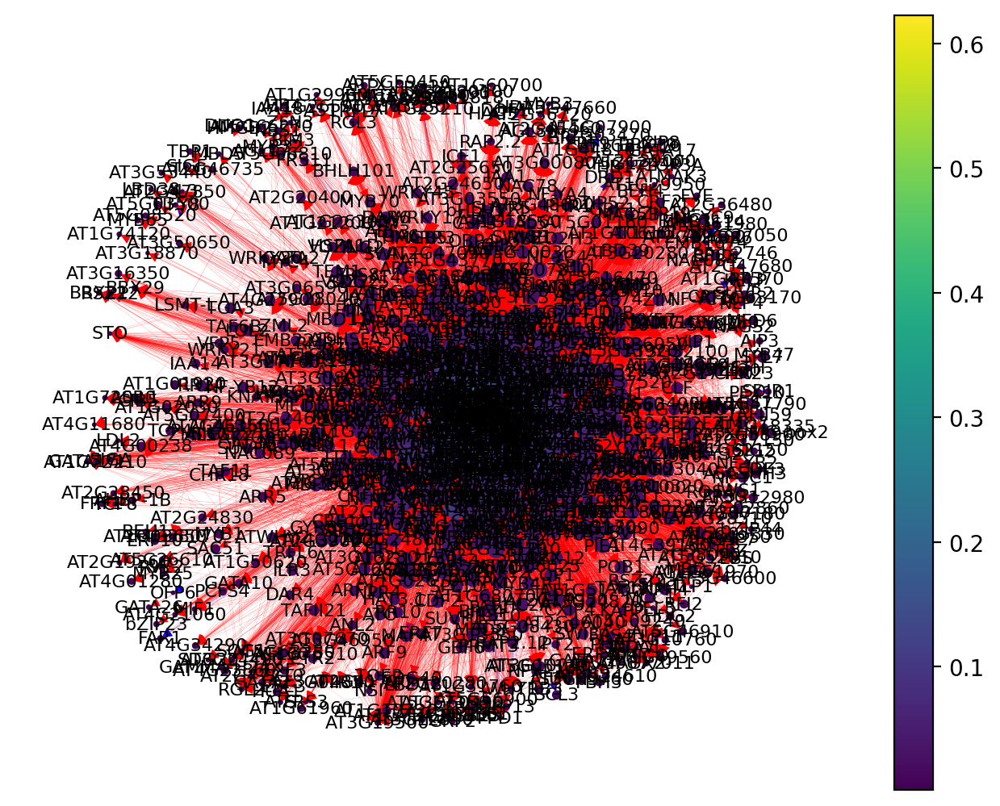

In [31]:
col = network(9)

In [32]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [33]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts())
tf_occurance = tf_occurance.rename(columns={
    'count': 'tf_occurance'
})
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [34]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum
ATS,0.425102,0.798927,0.030022,0.556452,0.311864,0.269912,0.207661,0.213559,0.212389,9,12.025888
AT2G36026,0.000020,0.005122,0.931649,0.040323,0.005085,0.116150,0.108871,0.033898,0.092920,9,10.334039
RAD54,0.000102,0.017482,0.464205,0.012097,0.016949,0.018805,0.086694,0.003390,0.073009,9,9.692732
AT1G05805,0.028409,0.000003,0.012162,0.167339,0.010169,0.168142,0.062500,0.011864,0.079646,9,9.540234
TFIIIA,0.002073,0.000420,0.000722,0.058468,0.008475,0.085177,0.026210,0.066102,0.039823,9,9.287469
AT2G36720,0.000257,0.000915,0.000058,0.078629,0.016949,0.036504,0.072581,0.018644,0.018805,9,9.243342
AT3G19360,0.000004,0.001706,0.000290,0.004032,0.008475,0.028761,0.122984,0.028814,0.045354,9,9.240420
WRKY7,0.002191,0.000224,0.022866,0.030242,0.016949,0.047566,0.038306,0.008475,0.036504,9,9.203325


In [35]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
EGL3,0.008871,0.857103,0.036290,0.174576,0.038306,0.161017,6,7.276164
WRKY9,0.002839,0.000081,0.395161,0.045763,0.008065,0.035593,6,6.487501
CRF4,0.072739,0.003914,0.171371,0.064407,0.102823,0.015254,6,6.430508
RL6,0.046974,0.003879,0.016129,0.072881,0.127016,0.003390,6,6.270269
SWI3B,0.039659,0.024653,0.008065,0.010169,0.070565,0.010169,6,6.163279
ATE2F2,0.025460,0.087318,0.002016,0.015254,0.010081,0.022034,6,6.162164
AT4G12850,0.000012,0.081192,0.038306,0.013559,0.004032,0.010169,6,6.147272
SCL21,0.000102,0.002305,0.050403,0.020339,0.020161,0.032203,6,6.125514
FHA2,0.001967,0.000006,0.044355,0.005085,0.028226,0.005085,6,6.084723


In [36]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
MYB97,0.860578,0.014113,0.036290,3,3.910981
GL2,0.246367,0.364919,0.108871,3,3.720157
ORC1A,0.165217,0.026210,0.040323,3,3.231749
TRY,0.125521,0.139113,0.227823,3,3.492457
BNQ3,0.048424,0.312500,0.060484,3,3.421408
TTG2,0.021314,0.312500,0.038306,3,3.372120
OFP18,0.003890,0.088710,0.024194,3,3.116793
bHLH11,0.003010,0.012097,0.020161,3,3.035268
AT4G38340,0.001975,0.006048,0.139113,3,3.147137
ULT2,0.001967,0.018145,0.018145,3,3.038258


In [37]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
RSL1,0.919743,0.137288,0.127119,3,4.184150
RHD6,0.895954,0.257627,0.155932,3,4.309513
AT3G53370,0.661512,0.533898,0.216949,3,4.412359
AGL102,0.649268,0.001695,0.037288,3,3.688251
RRS1,0.571155,0.015254,0.013559,3,3.599968
ATMYC1,0.566884,0.316949,0.222034,3,4.105867
AT5G22890,0.456591,0.033898,0.011864,3,3.502354
NAC042,0.449060,0.003390,0.006780,3,3.459230
ASIL1,0.267483,0.010169,0.003390,3,3.281042
AT2G05160,0.259653,0.042373,0.001695,3,3.303721


In [38]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
PS1,0.954564,0.038717,0.055310,3,4.048590
AT1G63100,0.931057,0.007743,0.060841,3,3.999641
SUVR2,0.746025,0.021018,0.042035,3,3.809078
AT5G19490,0.698304,0.064159,0.043142,3,3.805605
AT1G31760,0.221771,0.074115,0.142699,3,3.438585
AT5G12440,0.146736,0.030973,0.063053,3,3.240762
AT3G53440,0.065795,0.024336,0.019912,3,3.110042
LDL1,0.048227,0.026549,0.023230,3,3.098005
MBD11,0.046961,0.147124,0.105088,3,3.299174
AT2G44020,0.041624,0.017699,0.016593,3,3.075916


In [39]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
BPC7,0.743122,0.062358,0.069161,3,3.874641
BAM7,0.712683,0.017007,0.052154,3,3.781844
AT1G26680,0.698516,0.479592,0.806122,3,4.984230
AGL20,0.485232,0.056689,0.149660,3,3.691582
AGL94,0.352337,0.073696,0.103175,3,3.529208
...,...,...,...,...,...
WRKY14,0.000004,0.112245,0.001134,3,3.113383
PTM,0.000003,0.035147,0.009070,3,3.044220
MBD1,0.000003,0.043084,0.004535,3,3.047622
NAC053,0.000001,0.089569,0.023810,3,3.113380


In [40]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
ARR3,0.056141,0.004233,0.380342,0.675307,0.070513,0.121419,6,7.307954
JKD,0.086156,0.014779,0.378205,0.364256,0.188034,0.120055,6,7.151486
RVN,0.029137,0.022607,0.034188,0.103683,0.134615,0.117326,6,6.441557
ERF15,0.000146,0.003312,0.044872,0.229195,0.029915,0.088677,6,6.396116
OFP12,0.002507,0.000007,0.166667,0.087312,0.042735,0.083220,6,6.382449
BES1,0.000471,0.000144,0.202991,0.047749,0.036325,0.047749,6,6.335429
VRN1,0.000137,0.001066,0.081197,0.061392,0.049145,0.099591,6,6.292527
HAM3,0.000357,0.000671,0.143162,0.054570,0.021368,0.032742,6,6.252870
IDD4,0.009833,0.000062,0.094017,0.008186,0.010684,0.077763,6,6.200543
ARR4,0.000009,0.000002,0.029915,0.021828,0.049145,0.027285,6,6.128184


In [41]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
AT2G38300,0.091908,0.418803,0.102564,3,3.613275
APRR2,0.018169,0.047009,0.042735,3,3.107913
AT1G68070,0.010382,0.010684,0.047009,3,3.068074
AT2G42660,0.007604,0.275641,0.064103,3,3.347348
AL3,0.002754,0.008547,0.076923,3,3.088225
AT2G46810,0.000549,0.042735,0.004274,3,3.047558
RR3,0.000366,0.014957,0.049145,3,3.064469
ARIA,0.000352,0.017094,0.010684,3,3.028130
AT2G47890,0.000307,0.089744,0.047009,3,3.137059
AT2G36480,0.000279,0.004274,0.027778,3,3.032330


In [42]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
AT3G07260,0.331902,0.001364,0.030014,3,3.363280
MYB3,0.314966,0.889495,0.383356,3,4.587817
BIB,0.304734,0.399727,0.090041,3,3.794502
SCR,0.117714,0.538881,0.259209,3,3.915804
BLJ,0.026637,0.609823,0.118690,3,3.755150
RAX2,0.019526,0.680764,0.155525,3,3.855816
AT4G00390,0.004451,0.028649,0.035471,3,3.068571
HRS1,0.002973,0.107776,0.045020,3,3.155769
chr31,0.002842,0.169168,0.039563,3,3.211573
AT5G44080,0.002287,0.009550,0.005457,3,3.017294


In [43]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
MYB20,0.875978,0.952348,0.772683,0.738637,0.481808,0.682472,0.401156,0.066735,0.682470,0.453006,0.197688,0.091376,12,18.396357
AT3G43430,0.626868,0.402482,0.431843,0.103983,0.642778,0.816257,0.227746,0.690965,0.683572,0.820491,0.149133,0.547228,12,18.143347
BT1,0.837538,0.827188,0.124560,0.000097,0.190739,0.500423,0.442775,0.053388,0.195149,0.370872,0.132948,0.128337,12,15.804013
TMO6,0.022282,0.888108,0.009281,0.481533,0.384785,0.383573,0.010405,0.471253,0.059537,0.337849,0.031214,0.436345,12,15.516164
MYB43,0.880835,0.615568,0.248281,0.001281,0.310915,0.450466,0.025434,0.062628,0.404631,0.245555,0.027746,0.062628,12,15.335966
HB40,0.980696,0.126896,0.581119,0.129236,0.038589,0.036410,0.284393,0.598563,0.033076,0.033870,0.099422,0.332649,12,15.274918
AT1G69580,0.002094,0.882927,0.878708,0.093025,0.136714,0.290432,0.093642,0.391170,0.041896,0.262489,0.025434,0.175565,12,15.274097
IAA12,0.518888,0.193477,0.929888,0.002040,0.013230,0.444539,0.527168,0.065708,0.026461,0.212532,0.139884,0.071869,12,15.145683
UNE12,0.239265,0.654097,0.016292,0.000077,0.259096,0.475868,0.183815,0.086242,0.092613,0.414903,0.083237,0.111910,12,14.617415
AT3G20640,0.276767,0.991015,0.318920,0.064772,0.085998,0.159187,0.045087,0.162218,0.087100,0.212532,0.030058,0.044148,12,14.477801


In [44]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
AT3G21330,0.879964,0.041896,0.256891,3,4.178751
IDD11,0.836492,0.209482,0.211687,3,4.257661
MDA1,0.824614,0.025358,0.014333,3,3.864305
GATA23,0.800126,0.254686,0.151047,3,4.205859
AT5G46915,0.497931,0.020948,0.052922,3,3.571801
AT4G11400,0.214800,0.005513,0.008820,3,3.229133
AT5G52010,0.097342,0.012128,0.042999,3,3.152469
AT2G47680,0.034875,0.017641,0.009923,3,3.062438
AT1G21200,0.012534,0.007718,0.013230,3,3.033483
AT4G20970,0.005086,0.108049,0.013230,3,3.126364


In [45]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
WRKY26,0.951384,0.104996,0.104149,3,4.160529
AT3G16940,0.884967,0.171888,0.187976,3,4.244831
DAR6,0.858827,0.060119,0.033023,3,3.951968
AT4G21060,0.822046,0.012701,0.026249,3,3.860996
AT1G78930,0.424575,0.003387,0.027942,3,3.455904
IAA32,0.400781,0.016935,0.011008,3,3.428724
VIP1,0.247219,0.021169,0.016088,3,3.284476
HB24,0.230379,0.055038,0.039797,3,3.325213
AT5G46910,0.162015,0.034716,0.022015,3,3.218747
AT4G27900,0.107202,0.012701,0.013548,3,3.133451


In [46]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
ZHD3,0.988158,0.031214,0.065896,3,4.085268
AGL58,0.982121,0.173410,0.146821,3,4.302352
VND6,0.964376,0.057803,0.042775,3,4.064954
MYB83,0.955454,0.156069,0.092486,3,4.204009
AT5G18090,0.943056,0.065896,0.019653,3,4.028605
AT1G26610,0.938905,0.152601,0.052023,3,4.143529
VND1,0.916423,0.446243,0.132948,3,4.495614
TCP10,0.902602,0.183815,0.139884,3,4.226302
VND4,0.894953,0.364162,0.233526,3,4.492641
BZIP49,0.863843,0.041618,0.073988,3,3.979450


In [47]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
GATA20,0.973567,0.270021,0.251540,3,4.495127
NAC086,0.972790,0.196099,0.155031,3,4.323919
DOF6,0.946060,0.686858,0.431211,3,5.064130
HCA2,0.691290,0.496920,0.223819,3,4.412029
AT1G68030,0.675633,0.018480,0.003080,3,3.697194
AT4G37180,0.597349,0.564682,0.204312,3,4.366343
WOX2,0.571320,0.069815,0.034908,3,3.676043
PIF7,0.546462,0.010267,0.031828,3,3.588556
KAN2,0.469095,0.154004,0.147844,3,3.770943
AT1G76880,0.467731,0.004107,0.005133,3,3.476972


In [48]:
tf_spec.to_csv('scRNAseq_TF_GRN_centrality_t1-t3_zscore3.csv', index=True)

In [49]:
tf_spec

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
HMGA,8.0,0.231855,0.137097,0.094758,0.015669,0.000034,0.089956,0.054237,0.010169,0.044068,...,0.368583,0.001411,0.000444,0.090355,0.030612,0.014739,0.015873,0.000000,0.000126,0.013363
HTA2,8.0,0.207661,0.034274,0.173387,0.008207,0.000036,0.080602,0.047458,0.005085,0.042373,...,0.147844,0.006075,0.000397,0.047665,0.056689,0.048753,0.007937,0.000000,0.000120,0.022492
H2AXA,8.0,0.294355,0.177419,0.116935,0.859185,0.000035,0.098149,0.115254,0.020339,0.094915,...,0.104723,0.000000,0.000379,0.039862,0.126984,0.089569,0.037415,0.000642,0.000151,0.040209
HAT1,7.0,0.070565,0.020161,0.050403,0.001026,0.000028,0.036259,0.010169,0.001695,0.008475,...,0.100616,0.000248,0.000365,0.045064,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AT4G30410,7.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.320339,0.279661,0.040678,...,0.045175,0.000002,0.000301,0.029961,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AT3G22560,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BLH3,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ZFP8,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.010267,0.000000,0.000204,0.006205,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AT3G52270,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.004107,0.000000,0.000180,0.006133,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
